## Objective

To build a model capable of learning an artist's style.

Dataset used for already stylized target images: https://www.kaggle.com/datasets/vbookshelf/art-by-ai-neural-style-transfer/data

Dataset used for source images: https://www.kaggle.com/laurentmih/aisegmentcom-matting-human-datasets/

## Download the dataset

First create a kaggle API token and upload the generated JSON file.

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d vbookshelf/art-by-ai-neural-style-transfer

100% 463M/463M [00:25<00:00, 21.5MB/s]
100% 463M/463M [00:25<00:00, 19.0MB/s]


In [ ]:
!unzip -qq art-by-ai-neural-style-transfer.zip

In [ ]:
import os
input_dir = "Data\\source"
input_img_paths = sorted(
 [os.path.join(input_dir, fname)
 for fname in os.listdir(input_dir)
 if fname.endswith(".jpg")])
len(input_img_paths)

10200

Target dataset is very large (~ 31 GB). So I have downloaded and extracted only required images from the dataset. The size reduced to about 500 MB.

In [ ]:
target_dir = "Data\\target"
target_img_paths = sorted(
 [os.path.join(target_dir, fname)
 for fname in os.listdir(target_dir)
 if fname.endswith(".jpg")])
len(target_img_paths)

10200

# Single Image Style Transfer Demonstration

Style transfer consists in generating an image
with the same "content" as a base image, but with the
"style" of a different picture (typically artistic).
This is achieved through the optimization of a loss function
that has 3 components: "style loss", "content loss",
and "total variation loss":

- The total variation loss imposes local spatial continuity between
the pixels of the combination image, giving it visual coherence.
- The style loss is where the deep learning keeps in --that one is defined
using a deep convolutional neural network. Precisely, it consists in a sum of
L2 distances between the Gram matrices of the representations of
the base image and the style reference image, extracted from
different layers of a convnet (trained on ImageNet). The general idea
is to capture color/texture information at different spatial
scales (fairly large scales --defined by the depth of the layer considered).
- The content loss is a L2 distance between the features of the base
image (extracted from a deep layer) and the features of the combination image,
keeping the generated image close enough to the original one.

## Setup

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import vgg19

base_image_path = input_img_paths[0]
style_reference_image_path = "style_image.jpg"
result_prefix = "generated"

# Weights of the different loss components
total_variation_weight = 1e-6
style_weight = 1e-6
content_weight = 2.5e-8
# total_variation_weight = 1e-4
# style_weight = 1.0
# content_weight = 0.025

# Dimensions of the generated picture.
width, height = keras.utils.load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

## Let's take a look at our base (content) image and our style reference image

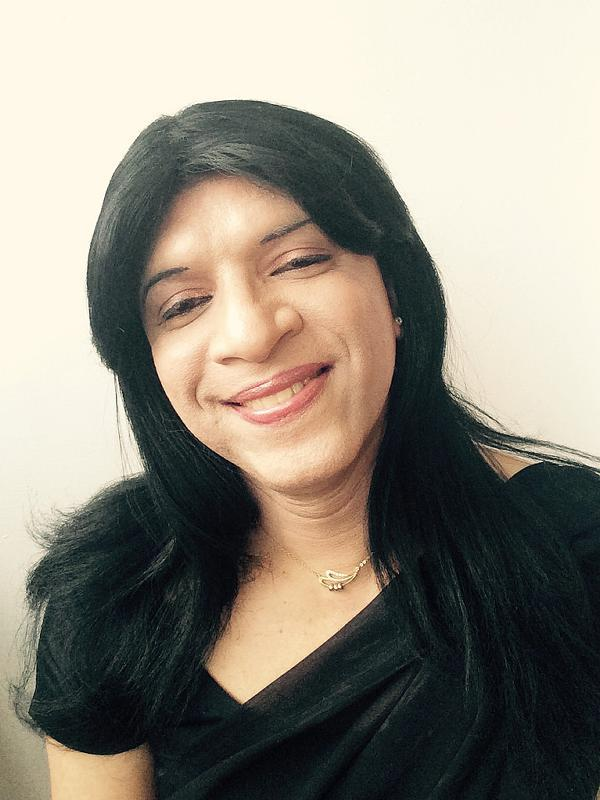

In [ ]:
from IPython.display import Image, display

display(Image(base_image_path))

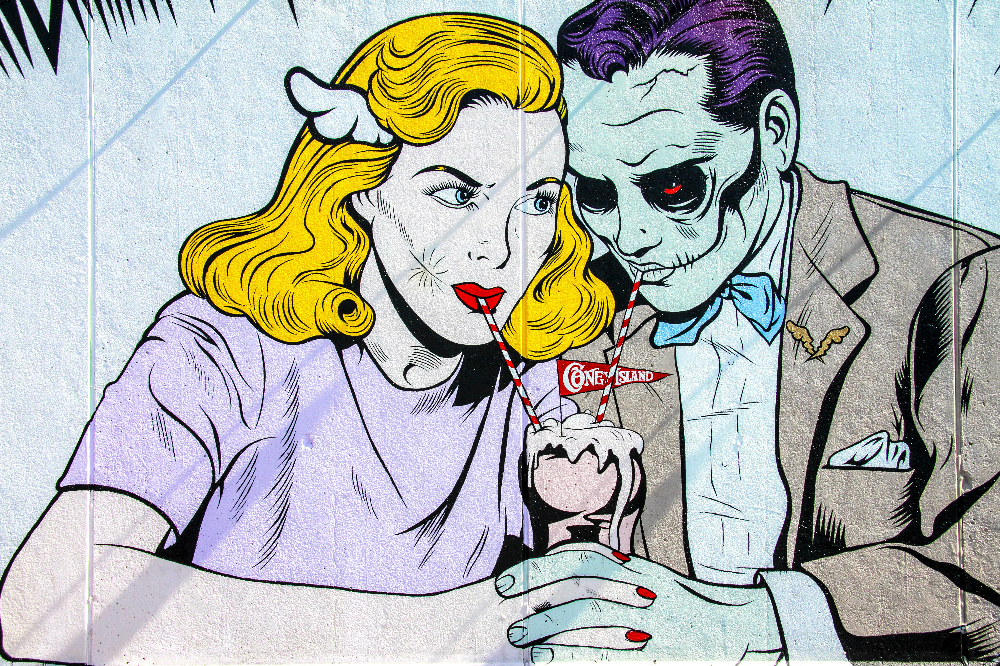

In [ ]:
display(Image(style_reference_image_path))

## Image preprocessing / deprocessing utilities

In [ ]:

def preprocess_image(image_path):
    # Util function to open, resize and format pictures into appropriate tensors
    img = keras.utils.load_img(
        image_path, target_size=(img_nrows, img_ncols)
    )
    img = keras.utils.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img)


def deprocess_image(x):
    # Util function to convert a tensor into a valid image
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype("uint8")
    return x


## Compute the style transfer loss

First, we need to define 4 utility functions:

- `gram_matrix` (Calculates the dot product of the style image and the generated image and it is used to compute the style loss)
- The `style_loss` function, which keeps the generated image close to the local textures
of the style reference image
- The `content_loss` function, which keeps the high-level representation of the
generated image close to that of the base image
- The `total_variation_loss` function, a regularization loss which keeps the generated
image locally-coherent

In [ ]:
# The gram matrix of an image tensor (feature-wise outer product)


def gram_matrix(x):
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    gram = tf.matmul(features, tf.transpose(features))
    return gram


# The "style loss" is designed to maintain
# the style of the reference image in the generated image.
# It is based on the gram matrices (which capture style) of
# feature maps from the style reference image
# and from the generated image


def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return tf.reduce_sum(tf.square(S - C)) / (4.0 * (channels**2) * (size**2))


# An auxiliary loss function
# designed to maintain the "content" of the
# base image in the generated image


def content_loss(base, combination):
    return tf.reduce_sum(tf.square(combination - base))


# The 3rd loss function, total variation loss,
# designed to keep the generated image locally coherent


def total_variation_loss(x):
    a = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, 1:, : img_ncols - 1, :]
    )
    b = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, : img_nrows - 1, 1:, :]
    )
    return tf.reduce_sum(tf.pow(a + b, 1.25))


Let's now build a feature extraction model that extracts the intermediate activations of VGG19 (by name, in the form of a dict).

In [ ]:
# Build a VGG19 model loaded with pre-trained ImageNet weights
model = vgg19.VGG19(weights="imagenet", include_top=False)

# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

# Set up a model that returns the activation values for every layer in
# VGG19 (as a dict).
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

80134624/80134624 [==============================] - 7s 0us/step


Finally, here's the code that computes the total style transfer loss.

In [ ]:
# List of layers to use for the style loss.
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]
# The layer to use for the content loss.
content_layer_name = "block5_conv2"


def compute_loss(combination_image, base_image, style_reference_image):
    input_tensor = tf.concat(
        [base_image, style_reference_image, combination_image], axis=0
    )
    features = feature_extractor(input_tensor)

    # Initialize the loss
    loss = tf.zeros(shape=())

    # Add content loss
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    loss = loss + content_weight * content_loss(
        base_image_features, combination_features
    )
    # Add style loss
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = style_loss(style_reference_features, combination_features)
        loss += (style_weight / len(style_layer_names)) * sl

    # Add total variation loss
    loss += total_variation_weight * total_variation_loss(combination_image)
    return loss


Compute Loss, calculate gradients with respect to the generated image

Add tf.function decorator to compile it, and thus make it fast.

In [ ]:

@tf.function
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss = compute_loss(combination_image, base_image, style_reference_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads


## The training loop

Repeatedly run gradient descent steps to minimize the loss, and save the
resulting image every 100 iterations.

We decay the learning rate by 0.96 every 100 steps.

In [ ]:
optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = preprocess_image(base_image_path)
style_reference_image = preprocess_image(style_reference_image_path)
combination_image = tf.Variable(preprocess_image(base_image_path))

epochs = 10
for i in range(1, epochs + 1):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])
    print("Epoch %d: loss=%.2f" % (i, loss))
    if i % 10 == 0:
        print("Epoch %d: loss=%.2f" % (i, loss))
        img = deprocess_image(combination_image.numpy())
        fname = result_prefix + "_at_epoch_%d.png" % i
        keras.utils.save_img(fname, img)

Epoch 1: loss=511675.06
Epoch 2: loss=270401.69
Epoch 3: loss=184147.81
Epoch 4: loss=264776.66
Epoch 5: loss=180024.81
Epoch 6: loss=233478.00
Epoch 7: loss=142322.94
Epoch 8: loss=165351.58
Epoch 9: loss=74207.30
Epoch 10: loss=80346.26
Epoch 10: loss=80346.26


In [ ]:
optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = preprocess_image(base_image_path)
style_reference_image = preprocess_image(style_reference_image_path)
combination_image = tf.Variable(preprocess_image(base_image_path))

epochs = 10
for i in range(1, epochs + 1):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])
    print("Epoch %d: loss=%.2f" % (i, loss))
    if i % 10 == 0:
        print("Epoch %d: loss=%.2f" % (i, loss))
        img = deprocess_image(combination_image.numpy())
        fname = result_prefix + "_at_epoch_%d.png" % i
        keras.utils.save_img(fname, img)

Epoch 1: loss=511675.06
Epoch 2: loss=270401.69
Epoch 3: loss=184147.81
Epoch 4: loss=264776.66
Epoch 5: loss=180024.81
Epoch 6: loss=233478.00
Epoch 7: loss=142322.94
Epoch 8: loss=165351.58
Epoch 9: loss=74207.30
Epoch 10: loss=80346.26
Epoch 10: loss=80346.26


After 10 iterations, you get the following result:

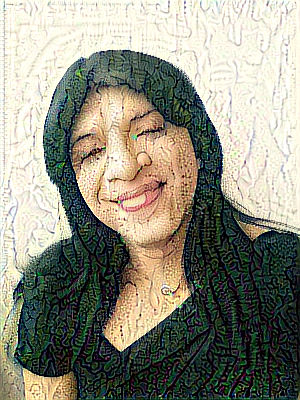

In [ ]:
display(Image(result_prefix + "_at_epoch_10.png"))

This is what the generated image in the given dataset looks like. Close enough!

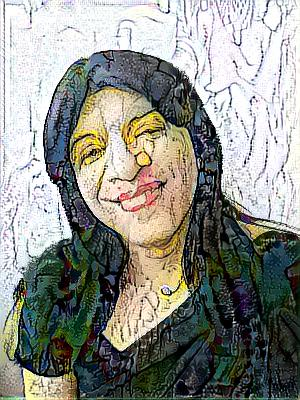

In [ ]:
display(Image(input_img_paths[0]))

# Training a model that can learn the features of the above style image

## Loading the Dataset

In [ ]:
import os
import cv2
from PIL import Image
import numpy as np
from keras.utils import normalize
import matplotlib.pyplot as plt

The dataset contains over 10k images. However, I have taken only the first 4000 images to save time on training. The tradeoff being impact on performance of the model

In [ ]:
input_dataset=[]
for i,image_path in enumerate(input_img_paths):
  if i == 4000:
    break
  image=Image.open(image_path)
  # image=Image.fromarray(image)
  image=image.resize((256,256))
  input_dataset.append(np.array(image))

In [ ]:
print(len(input_dataset))
print(input_dataset[0].shape)

4000
(256, 256, 3)


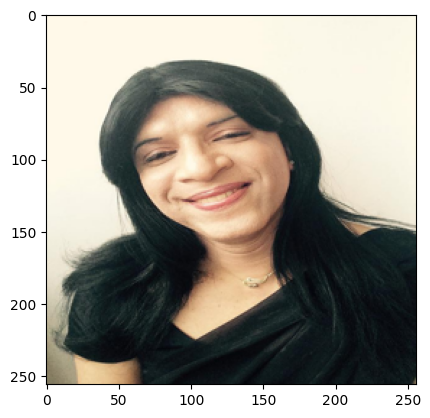

In [ ]:
plt.imshow(input_dataset[0])

In [ ]:
target_dataset=[]
for i,image_path in enumerate(target_img_paths):
  if i == 4000:
    break
  image=Image.open(image_path)
  image=image.resize((256,256))
  target_dataset.append(np.array(image))

In [ ]:
print(len(target_dataset))
print(target_dataset[0].shape)

4000
(256, 256, 3)


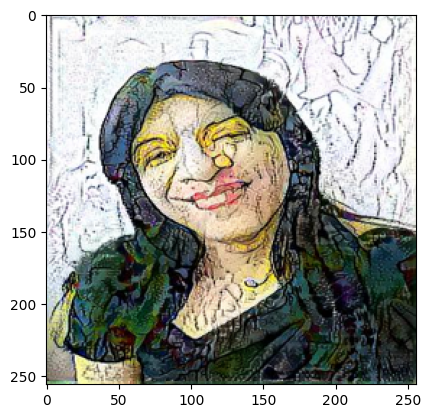

In [ ]:
plt.imshow(target_dataset[0])

In [ ]:
source_data = np.array(input_dataset)
target_data = np.array(target_dataset)

In [ ]:
print(source_data.shape)
print(target_data.shape)

(4000, 256, 256, 3)
(4000, 256, 256, 3)


In [ ]:
source_data = source_data / 255
target_data = target_data / 255

In [ ]:
del input_dataset
del target_dataset

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(source_data,target_data,test_size=0.2,random_state=2)

In [ ]:
import tensorflow as tf

In [ ]:
height=256
width=256
channels=3

## The Model

The model used is a 2D UNET model based on CNNs.
UNET comprises of a series of convolutional (and maxpooling) layers which are downsampled to learn features such as textures, and a series of reverse convolution layers which are upsampled to build an image matching the size and shape of the original one.

Here, I have taken the source and target image in the same size.

In [ ]:
inputs=tf.keras.layers.Input((height,width,channels))

c1=tf.keras.layers.Conv2D(16,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(inputs)
c1=tf.keras.layers.Dropout(0.1)(c1)
c1=tf.keras.layers.Conv2D(16,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(c1)
p1=tf.keras.layers.MaxPooling2D((2,2))(c1)


c2=tf.keras.layers.Conv2D(32,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(p1)
c2=tf.keras.layers.Dropout(0.1)(c2)
c2=tf.keras.layers.Conv2D(32,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(c2)
p2=tf.keras.layers.MaxPooling2D((2,2))(c2)

c3=tf.keras.layers.Conv2D(64,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(p2)
c3=tf.keras.layers.Dropout(0.1)(c3)
c3=tf.keras.layers.Conv2D(64,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(c3)
p3=tf.keras.layers.MaxPooling2D((2,2))(c3)

c4=tf.keras.layers.Conv2D(128,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(p3)
c4=tf.keras.layers.Dropout(0.1)(c4)
c4=tf.keras.layers.Conv2D(128,(3,3),activation='relu',kernel_initializer='he_normal',padding='same', name='c4_2')(c4)
p4=tf.keras.layers.MaxPooling2D((2,2))(c4)

c5=tf.keras.layers.Conv2D(256,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(p4)
c5=tf.keras.layers.Dropout(0.1)(c5)
c5=tf.keras.layers.Conv2D(256,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(c5)

#upsampling
v6=tf.keras.layers.Conv2DTranspose(128,(2,2),strides=(2,2),padding='same')(c5)
v6=tf.keras.layers.concatenate([v6,c4])
c6=tf.keras.layers.Conv2D(128,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(v6)
c6=tf.keras.layers.Dropout(0.2)(c6)
c6=tf.keras.layers.Conv2D(128,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(c6)

v7=tf.keras.layers.Conv2DTranspose(64,(2,2),strides=(2,2),padding='same')(c6)
v7=tf.keras.layers.concatenate([v7,c3])
c7=tf.keras.layers.Conv2D(64,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(v7)
c7=tf.keras.layers.Dropout(0.2)(c7)
c7=tf.keras.layers.Conv2D(64,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(c7)

v8=tf.keras.layers.Conv2DTranspose(32,(2,2),strides=(2,2),padding='same')(c7)
v8=tf.keras.layers.concatenate([v8,c2])
c8=tf.keras.layers.Conv2D(32,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(v8)
c8=tf.keras.layers.Dropout(0.2)(c8)
c8=tf.keras.layers.Conv2D(32,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(c8)

v9=tf.keras.layers.Conv2DTranspose(16,(2,2),strides=(2,2),padding='same')(c8)
v9=tf.keras.layers.concatenate([v9,c1],axis=3)
c9=tf.keras.layers.Conv2D(16,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(v9)
c9=tf.keras.layers.Dropout(0.2)(c9)
c9=tf.keras.layers.Conv2D(16,(3,3),activation='relu',kernel_initializer='he_normal',padding='same')(c9)

outputs=tf.keras.layers.Conv2DTranspose(channels,(2,2),padding='same')(c9)

model=tf.keras.Model(inputs=[inputs],outputs=[outputs])

In [ ]:
model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_103 (Conv2D)            (None, 256, 256, 16  448         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_54 (Dropout)           (None, 256, 256, 16  0           ['conv2d_103[0][0]']             
                                )                                                           

## Compile the model

I have taken mean squard error as the loss function as it computes a pixel by pixel squared error.

In [ ]:
model.compile(optimizer='adam',loss='mean_squared_error')

Add checkpoints and early stopping

In [ ]:
checkpointer=tf.keras.callbacks.ModelCheckpoint('model_for_nuclei.h5',verbose=1,save_best_only=True)
early=tf.keras.callbacks.EarlyStopping(patience=5,monitor='val_loss')
callback=[checkpointer,early]
results=model.fit(x_train,y_train,validation_split=0.2,batch_size=8,epochs=50,callbacks=callback)

Epoch 1/50
320/320 [==============================] - ETA: 0s - loss: 0.0269
Epoch 1: val_loss improved from inf to 0.01891, saving model to model_for_nuclei.h5
320/320 [==============================] - 24s 74ms/step - loss: 0.0269 - val_loss: 0.0189
Epoch 2/50
320/320 [==============================] - ETA: 0s - loss: 0.0190
Epoch 2: val_loss improved from 0.01891 to 0.01796, saving model to model_for_nuclei.h5
320/320 [==============================] - 23s 71ms/step - loss: 0.0190 - val_loss: 0.0180
Epoch 3/50
320/320 [==============================] - ETA: 0s - loss: 0.0178
Epoch 3: val_loss improved from 0.01796 to 0.01682, saving model to model_for_nuclei.h5
320/320 [==============================] - 23s 72ms/step - loss: 0.0178 - val_loss: 0.0168
Epoch 4/50
320/320 [==============================] - ETA: 0s - loss: 0.0170
Epoch 4: val_loss improved from 0.01682 to 0.01589, saving model to model_for_nuclei.h5
320/320 [==============================] - 23s 72ms/step - loss: 0.0170

This one goes to about 45 epochs before overfitting

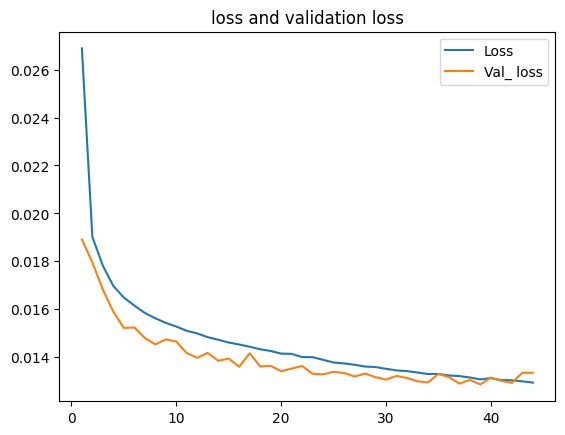

In [ ]:
loss=results.history['loss']
val_loss=results.history['val_loss']
epochs=range(1,len(loss)+1)
plt.figure()
plt.plot(epochs,loss,label='Loss')
plt.plot(epochs,val_loss,label='Val_ loss')
plt.title('loss and validation loss')
plt.legend()
plt.show()

## Evaluation

In [ ]:
acc=model.evaluate(x_test,y_test)
print(acc)

25/25 [==============================] - 2s 79ms/step - loss: 0.0135
0.013491243124008179


## Generated Image Comparision

In [ ]:
import random

In [ ]:
test_img_number=random.randint(0,len(x_test))
test_img=x_test[test_img_number]
ground_truth=y_test[test_img_number]
# test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img,0)
prediction=(model.predict(test_img_input)[0] * 255).astype(np.uint8)

1/1 [==============================] - 0s 164ms/step


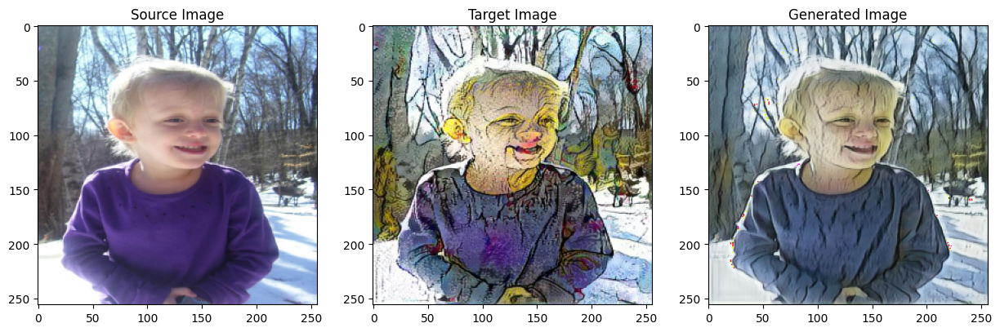

In [ ]:
plt.figure(figsize=(15,15))
plt.subplot(131)
plt.title('Source Image')
plt.imshow((test_img * 255).astype(np.uint8))
plt.subplot(132)
plt.title('Target Image')
plt.imshow((ground_truth * 255).astype(np.uint8))
plt.subplot(133)
plt.title('Generated Image')
plt.imshow(prediction)
plt.show()

Clear GPU cache for memory management

In [ ]:
import torch, gc
gc.collect()
torch.cuda.empty_cache()

## Limitations

- Loss: Mean Squared Error loss only compares pixel by pixel, thereby losing the ability to capture some of the coarser textures. The loss functions metioned above like the content loss, gram matrix, and the variation loss can be taken either independently or in some combination to preserve the content and style.